In [1]:
# !pip install openai-whisper==20230124
# !pip install torchaudio==0.13.1 --extra-index-url https://download.pytorch.org/whl/cu116

In [2]:
# !pip install pandas numpy matplotlib

In [3]:
import whisper
import torch
import torchaudio as ta
import matplotlib.pyplot as plt
import pandas as pd
from pprint import pprint
from IPython.display import Audio, display

print(whisper.__version__)
print(ta.__version__)
print(torch.__version__)


20230124
0.13.1+cu116
1.13.1+cu116


In [4]:
SR = 16000
target_file = '../data/db short intro.ogg'
whisper_dir = '../models/whisper'
silero_dir = '../models/silero-vad'
silero_repo = 'snakers4/silero-vad'


In [5]:
transcriber =   whisper.load_model('small.en', download_root= whisper_dir)
vad, utils =    torch.hub.load(repo_or_dir=silero_dir,
                               source='local',
                               model='silero_vad',
                               force_reload=True,
                               onnx=False)

(get_speech_timestamps,
 save_audio,
 read_audio,
 VADIterator,
 collect_chunks) = utils


In [6]:
wav = whisper.load_audio(target_file)
wav = torch.tensor(wav)

In [7]:
wav.shape

torch.Size([4885024])

In [8]:
# target_file = '../data/db short intro.ogg'
# wav = read_audio(target_file, sampling_rate=SR)

In [9]:
Audio(wav, rate=SR)

In [10]:
speech_timestamps = get_speech_timestamps(wav, vad)

c:\Python\3.10.8\lib\site-packages\torch\nn\modules\module.py:1194: UserWarning: operator () profile_node %668 : int[] = prim::profile_ivalue(%666)
 does not have profile information (Triggered internally at ..\torch\csrc\jit\codegen\cuda\graph_fuser.cpp:109.)
  return forward_call(*input, **kwargs)


In [11]:
# for entry in speech_timestamps:
#     entry['data'] = wav[entry['start'] : entry['end']]

# print(speech_timestamps[0:2])

In [12]:
# lower_threshold_segments = get_speech_timestamps(wav, vad, threshold=0.4)

In [13]:
import matplotlib.pyplot as plt

cmap = plt.get_cmap('Set1')
colors = cmap.colors[:-1]
bg = cmap.colors[-1]

def slice_wav(waveform, segment):
    start, end = segment['start'], segment['end']
    return waveform[start:end]

def plot_waveform_segments(waveform, segments, colors):
    start_bound = segments[0]['start']
    end_bound = segments[-1]['end']
    fig, ax = plt.subplots()
    ax.plot(range(start_bound, end_bound),wav[start_bound:end_bound], color=bg, alpha=0.4)
    for i, segment in enumerate(segments):
        ax.plot(range(segment['start'],segment['end']), slice_wav(waveform, segment), color=colors[i % len(colors)])
    ax.set_xlabel("Sample index")
    ax.set_ylabel("Amplitude")
    plt.show()



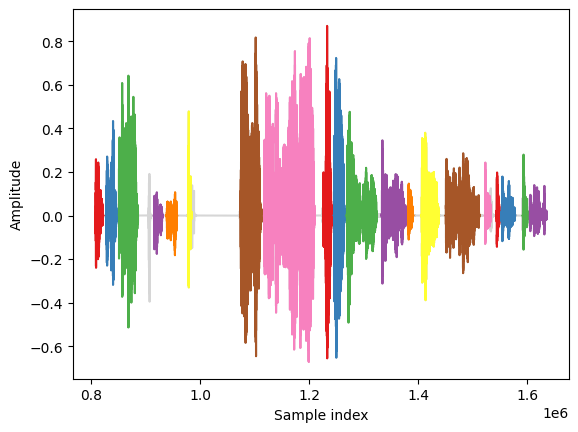

In [14]:
a, b = 20, 40
plot_waveform_segments(wav, speech_timestamps[a:b], colors)
# plot_waveform_segments(wav, lower_threshold_segments[a:b], colors)

In [15]:
datas = [slice_wav(wav, segment) for segment in speech_timestamps]
texts = [transcriber.transcribe(data) for data in datas]

In [16]:
results_whisper_only = transcriber.transcribe(wav)

In [17]:
whisper_segments = results_whisper_only['segments']

for segment in whisper_segments:
    start, end = segment['start'], segment['end']
    segment['start'] = int(start*SR)
    segment['end'] = int(end*SR)

whisper_segments[0]

{'id': 0,
 'seek': 0,
 'start': 0,
 'end': 30080,
 'text': " Oh my god, he's loud again.",
 'tokens': [3966, 616, 5770, 11, 339, 338, 7812, 757, 13],
 'temperature': 0.0,
 'avg_logprob': -0.3752633698132573,
 'compression_ratio': 1.5341614906832297,
 'no_speech_prob': 0.29823726415634155}

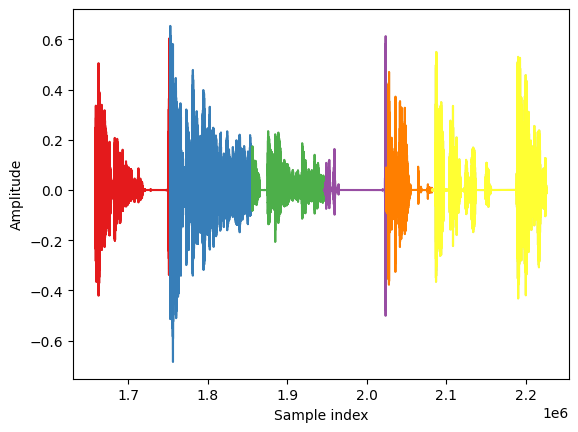

In [18]:
a, b = 29, 35
plot_waveform_segments(wav, whisper_segments[a:b], colors)
# Speech segments as identified by Open-ai's Whisper

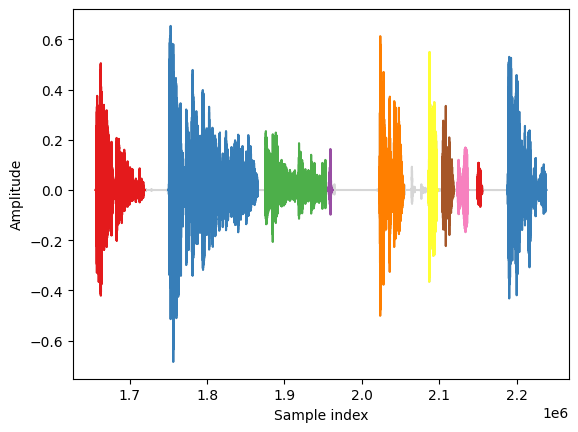

In [22]:
c, d = 40, 50
plot_waveform_segments(wav, speech_timestamps[c:d], colors)
# Speech segments as identified by Silero's VAD model

## Whisper timestamps and transcription performance

As we can see with the two plots above there is a significant divergence between the identified segments and their timestamps.  

- Silero's VAD is much better at cleanly identifying when speech starts and stops (although it can result in rather short segments at times).
- Whisper's transcription accuracy suffers when transcribing short segments.
- Using `model.transcribe()` on each of Silero's segments results in a significantly longer transcription time.

In [ ]:
# Listing things for easy finding
whisper.transcribe()
whisper.audio.log_mel_spectrogram()

Diving into the code behind whisper it appears that one of the first things it does is convert the data into a logarithmic mel spectrogram.  This is a popular method in audio ML because it more closely represents how humans perceive sound than raw frequency data.

In [26]:
import librosa, librosa.display

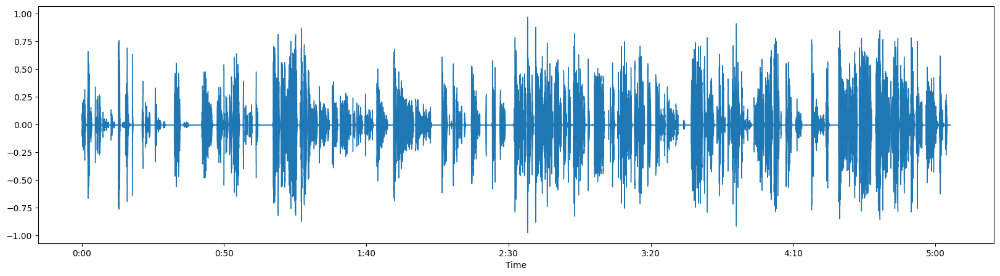

In [29]:
plt.figure(figsize=(20, 5))
librosa.display.waveshow(wav.numpy(), sr=SR)

In [30]:
spectrogram = whisper.audio.log_mel_spectrogram(wav )
spectrogram

tensor([[-0.2289, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.0948, -0.1581, -0.0053,  ..., -0.5421, -0.5421, -0.5421],
        [ 0.2111,  0.1416,  0.2411,  ..., -0.5421, -0.5421, -0.5421],
        ...,
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421]])

In [39]:
spectrogram.shape, wav.shape

(torch.Size([80, 30531]), torch.Size([4885024]))

In [40]:
4885024/30531

160.00209623006126

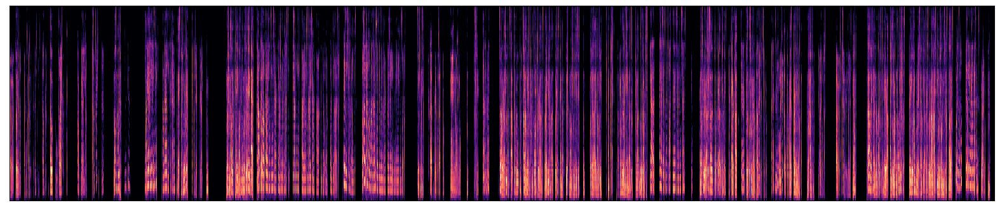

In [36]:
plt.figure(figsize=(20,4))
librosa.display.specshow(spectrogram.numpy(), sr=SR, cmap='magma')

In [41]:
spectrogram.to('cuda')

tensor([[-0.2289, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.0948, -0.1581, -0.0053,  ..., -0.5421, -0.5421, -0.5421],
        [ 0.2111,  0.1416,  0.2411,  ..., -0.5421, -0.5421, -0.5421],
        ...,
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421]],
       device='cuda:0')

In [43]:
spectrogram

tensor([[-0.2289, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.0948, -0.1581, -0.0053,  ..., -0.5421, -0.5421, -0.5421],
        [ 0.2111,  0.1416,  0.2411,  ..., -0.5421, -0.5421, -0.5421],
        ...,
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421],
        [-0.5421, -0.5421, -0.5421,  ..., -0.5421, -0.5421, -0.5421]])

In [44]:
transcriber.decode(spectrogram.to('cuda'))

AssertionError: incorrect audio shape

In [49]:
mysegment = slice_wav(wav, speech_timestamps[10])
Audio(mysegment, rate=SR)
# "We got a session of DnD comin' up."

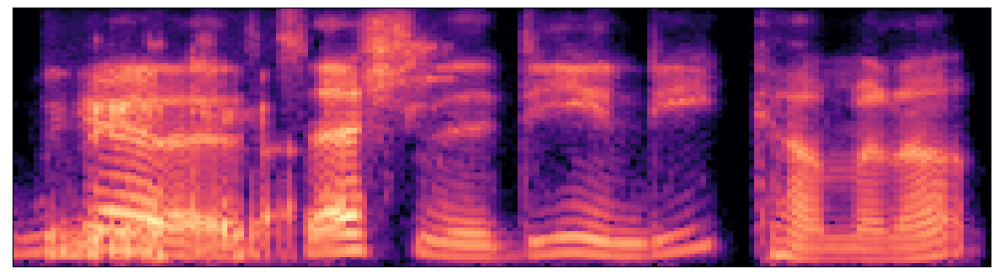

In [51]:
myspectrogram = whisper.audio.log_mel_spectrogram(mysegment)
plt.figure(figsize=(15,4))
librosa.display.specshow(myspectrogram.numpy(), sr=SR, cmap='magma')

In [52]:
transcriber.decode(myspectrogram.to('cuda'))

AssertionError: incorrect audio shape